# Машинное обучение, ВМК МГУ

# Практическое задание 1. Обучение без учителя.

## Общая информация
Дата выдачи: 22.02.2024

Мягкий дедлайн: 07.03.2024 23:59 MSK

Жёсткий дедлайн: 14.03.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-1-Username.ipynb

Username — ваша фамилия на латинице

## О задании



В этом задании вам предлагается поработать с различными методами кластеризации и посмотреть их работу на различных данных

In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm

np.random.seed(0xFFFFFFF)

## Часть 1. Тематическое моделирование текстов.

В этом задании мы сравним разные алгоритмы кластеризации для задачи тематического моделирования.

**Задание 1.1 (1 балл).** Для начала реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Здесь необходимо использовать вариацию с ненормированным лапласианом.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters
        elif n_components < n_clusters:
            raise ValueError("n_components must be less than n_clusters")

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)

        labels = self.kmeans.fit_predict(eigenvectors[:, 1:], y)
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        # IT'S MY CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        # AAAAAAAAAAAAAAAAAAAAAAAAAA
        D = np.diag(np.sum(X, axis=1))
        Laplasian = D - X

        # get eigenvectors for spectral clustering
        eigenvectors = np.linalg.eigh(Laplasian)[1]
        return eigenvectors[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [8]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

In [17]:
! fortune

Tyger, Tyger, burning bright		Where the hammer?  Where the chain?
In the forests of the night,		In what furnace was thy brain?
What immortal hand or eye		What the anvil?  What dread grasp
Dare frame thy fearful symmetry?	Dare its deadly terrors clasp?

Burnt in distant deeps or skies		When the stars threw down their spears
The cruel fire of thine eyes?		And water'd heaven with their tears
On what wings dare he aspire?		Dare he laugh his work to see?
What the hand dare seize the fire?	Dare he who made the lamb make thee?

And what shoulder & what art		Tyger, Tyger, burning bright
Could twist the sinews of they heart?	In the forests of the night,
And when thy heart began to beat	What immortal hand or eye
What dread hand & what dread feet	Dare frame thy fearful symmetry?

Could fetch it from the furnace deep
And in thy horrid ribs dare steep
In the well of sanguine woe?
In what clay & in what mould
Were thy eyes of fury roll'd?
		-- William Blake, "The Tyger"


**Задание 1.2 (0.5 балла)** Теперь приступим к применению разных алгоритмов кластеризации для одной из самых популярных задач обучения без учителя: задачи тематического моделирования текстов.

Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. То есть, фактически, перед вами стоит задача кластеризации текстов с тем лишь дополнением что требется не только разбить тексты на группы, но и выделить ключевые слова, определяющие каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [3]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [4]:
import re
from gensim.parsing.preprocessing import remove_stopwords
from num2words import num2words


def change_nums_to_str(st: str) -> str:
    matches = re.finditer('\d+', st)
    answ = ''
    indexes = [0]
    for start, end in [(m.start(), m.end()) for m in matches]:
        indexes.append(start)
        indexes.append(end)
    indexes.append(len(st))
    flipper = True
    for start, end in zip(indexes, indexes[1:]):
        try:
            answ += st[start:end] if flipper else \
                f' {num2words(int(st[start:end]))} '
        except:
            answ += ' '
        flipper = not flipper
    return answ


data['text'] = data['title'] + ' ' + data['content']
data['text'] = data.text.apply(lambda st: change_nums_to_str(st))
data['text'] = data.text.apply(lambda st: remove_stopwords(st))
data['text'] = data.text.apply(
    lambda st: re.sub('[\W_]+', ' ', st.lower()))

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [5]:
from wordcloud import WordCloud


def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

In [7]:
data.text

0       ad sales boost time warner profit quarterly pr...
1       dollar gains greenspan speech the dollar hit h...
2       yukos unit buyer faces loan claim the owners e...
3       high fuel prices hit ba s profits british airw...
4       pernod takeover talk lifts domecq shares uk dr...
                              ...                        
2220    bt program beat dialler scams bt introducing i...
2221    spam e mails tempt net shoppers computer users...
2222    be careful code a new european directive softw...
2223    us cyber security chief resigns the man making...
2224    losing online gaming online role playing games...
Name: text, Length: 2225, dtype: object

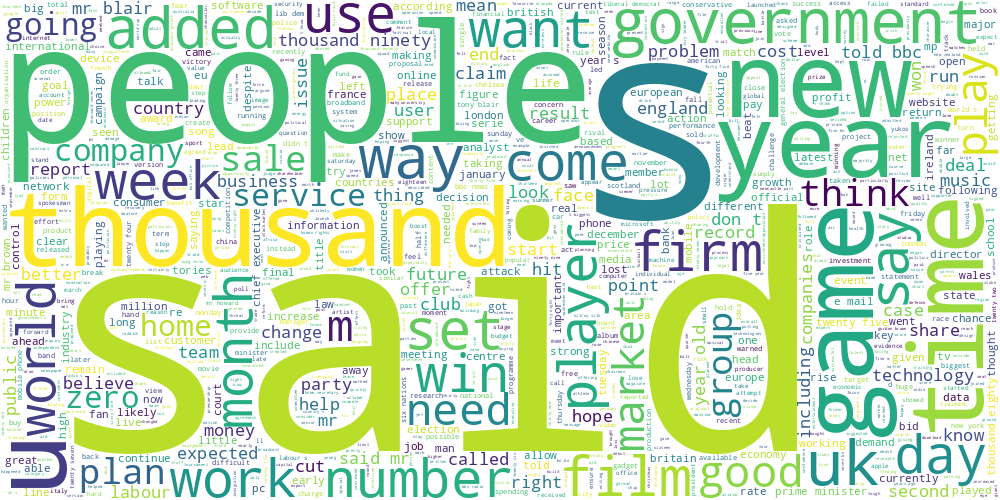

In [8]:
draw_wordcloud(data.text)

**Задание 1.3 (1 балл).** Начнем с простого: обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. (?) Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

Получившиеся диаграммы слов вполне точно позволяют предположить направленность документов (новостных статей), что принадлежат каждому из кластеров:

1. Статьи приурочены к матчу по рэгби между Англией и Вэльсом
2. Новости оговорят про экономическое положение больших компаний
3. Статьи про новости в искусстве (музыке)
4. Обозреваются новости tech и it
5. Тематика закладывается на выборах в государственное управление
6. Так же обозревается спортиваня игра, только на этот раз по футболу между Манчестером и Арсеналом
7. Обсуждается церимония награждения фильмов
8. Обсуждается внешняя торговая политика

$\rightarrow$ поэтому заголовки:
1. Матч по рэгби между Англией и Вэльсом
2. Микроэкономика
3. Новости музыки
4. Новости tech-it
5. Выборы в государстве X
6. Футбольный матч между Манчестером и Арсеналом
7. Новости кино
8. Торговая политика страны X


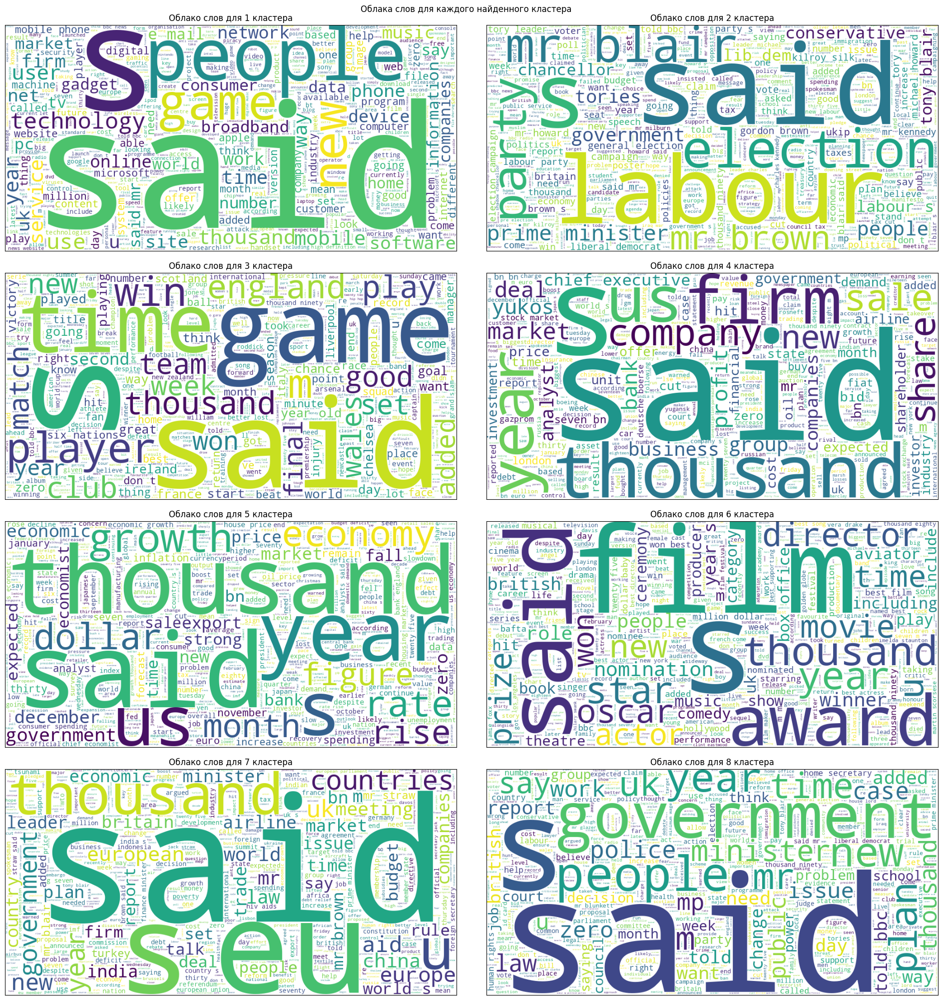

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

tf_idf = TfidfVectorizer(min_df=20, max_df=0.4)
X = tf_idf.fit_transform(data.text)
km = KMeans()

clusters = km.fit_predict(X)

fig, axis = plt.subplots(4, 2, figsize=(20, 20))
fig.tight_layout()
fig.subplots_adjust(wspace=0.001)
title = fig.suptitle('Облака слов для каждого найденного кластера')
title.set_position((0.5, 1.01))

for ax_row in axis:
    for ax in ax_row:
        ax.get_yaxis().set_visible(False)
        ax.get_xaxis().set_visible(False)

for i in range(8):
    indexes = np.where(clusters == i)
    corr_lines = data.iloc[indexes]
    axis[i // 2, i % 2].imshow(draw_wordcloud(corr_lines.text))
    axis[i // 2, i % 2].set_title(f'Облако слов для {i + 1} кластера')

**Задание 1.4 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на несколько слов с наибольшими числовыми значениями. (?) Соответствуют ли полученные слова облакам тегов из прошлого задания?

**Ответ:**

Получаемые слова очень хорошо вмешают и отражают смысл кластеров, что в свою очередь мы можем видеть по много большей выборке слов. Это говорит о том, что кластерризация пытается выделить смысл облаков объектов, найти в предложениях те признаки, что наиболее хорошо характеризуют совокупность примеров, входящих в состав данного класетра.

In [10]:
sorted_words = np.argsort(km.cluster_centers_, axis=1)
ind_vocab = {ind: word for word, ind in tf_idf.vocabulary_.items()}

NUMBER_OF_BEST_WORDS = 10

for i, sorted in enumerate(sorted_words[:, ::-1][:, :NUMBER_OF_BEST_WORDS]):
    words = list(map(lambda ind: ind_vocab[ind], sorted))
    print(f'Cluster {i + 1}: {"; ".join(words)}')

Cluster 1: bn; growth; us; sales; shares; market; economy; company; oil; bank
Cluster 2: music; band; album; singer; tv; us; best; chart; star; song
Cluster 3: game; england; win; cup; match; team; players; we; he; club
Cluster 4: mr; government; people; police; he; lord; secretary; public; law; plans
Cluster 5: film; best; awards; oscar; award; films; festival; actor; actress; director
Cluster 6: mr; eu; us; countries; european; president; government; foreign; bn; law
Cluster 7: mobile; people; technology; users; digital; software; phone; net; microsoft; broadband
Cluster 8: labour; mr; election; party; blair; brown; howard; tax; chancellor; prime


**Задание 1.5 (можно получить 1.5, 1 или 2.5 баллов)** Попробуем усовершенствовать метод. Реализуйте в приведенном ниже шаблоне ядерный K-means(1.5 баллов) или эллипсоидный метод(1 балл) (можно оба сразу, тогда баллы сложатся). И попробуйте применить его для решаемой задачи. (?)Насколько существенно отличаются  центры кластеров и облака тегов от таковых для предыдущих методов?

In [10]:
import scipy.spatial


class ClusterManager:
    def __init__(self, n_clusters, iters, initialization_method, verbose):
        self.n_clusters = n_clusters
        self.iters = iters
        self.centroids = None
        self.verbose = verbose

        if initialization_method not in ['random', 'farrest']:
            raise ValueError("Unknown initialization method")
        self.initialization_method = initialization_method

    def initialize_clusters(self, X):
        """
        Initialize centroids.

        Args:
        X (ndarray): Dataset samples

        Returns:
        centroids (ndarray): Initial position of centroids according to choosen method
        """
        if self.initialization_method == 'random':
            self.centroids = X[np.random.randint(
                X.shape[0], size=(self.n_clusters)), :]

        if self.initialization_method == 'farrest':
            dists = np.zeros((X.shape[0], X.shape[0]))
            dists[np.triu_indices(n=X.shape[0], k=1)] = scipy.spatial.distance.pdist(
                X, 'minkowski', p=2.)
            dists = dists + dists.T

            farrest_indexes = np.argsort(dists.sum(axis=1))[-1:].tolist()

            for _ in range(self.n_clusters - 1):
                new_dists = scipy.spatial.distance_matrix(
                    X, X[farrest_indexes], p=2)
                dists = np.sum(new_dists, axis=1) - \
                    np.sum(1 / (new_dists + 1e-8), axis=1)
                farrest_indexes.append(np.argmax(dists))

            self.centroids = X[farrest_indexes, :]

        return self.centroids

    def get_centroids(self):
        """
        Return the computed centroids
        """
        return self.centroids

    def fit_predict(self, X):
        raise NotImplementedError()

In [11]:
class KernelKMeans(ClusterManager):
    def __rbf_valid(self, gamma=1.0):
        def inner(X):
            d_matr = np.exp(- gamma * scipy.spatial.distance_matrix(X,
                            self.centroids, p=2) ** 2)
            valid_centroid = np.argmax(d_matr, axis=1)
            return valid_centroid

        return inner

    def __dgram_valid(self, n_grams=2):
        self.n_grams = n_grams

        def inner(X):
            d_matr = scipy.spatial.distance_matrix(X, self.centroids, p=2)
            valid_centroid = np.argmin(d_matr, axis=1)
            return valid_centroid
        return inner

    def __eleptical_valid(self, eps=1e-5):
        def inner(X):
            d_matr = np.ndarray((X.shape[0], self.n_clusters))
            for i in range(self.n_clusters):
                # pinv is pseudo invert matrix -> elipsises might be in lower dimension than initial
                # in this case cov matrix can be inevertable
                d_matr[:, i] = scipy.spatial.distance.cdist(X, self.centroids[i].reshape((1, -1)),
                                                            'mahalanobis', VI=np.linalg.inv(self.cov[i] + eps * np.diag(np.ones((self.cov[i].shape[0]))))).reshape((-1))

            valid_centroid = np.argmin(d_matr, axis=1)
            return valid_centroid

        return inner

    def __custom_mahalanobis_valid(self, cov_matr):
        def inner(X):
            d_matr = np.ndarray((X.shape[0], self.n_clusters))
            for i in range(self.n_clusters):
                d_matr[:, i] = scipy.spatial.distance.cdist(X, self.centroids[i].reshape((1, -1)),
                                                            'mahalanobis', VI=cov_matr).reshape((-1))
            valid_centroid = np.argmin(d_matr, axis=1)
            return valid_centroid

        return inner

    def __init__(self, n_clusters, iters, kernel, initialization_method='random', verbose=False, **kwargs):
        """
        KMeans Class constructor.

        Args:
        n_clusters (int) : Number of clusters used for partitioning.
        iters (int) : Number of iterations until the algorithm stops.

        """
        super().__init__(n_clusters, iters,
                         initialization_method=initialization_method, verbose=verbose)
        if kernel not in ['rbf', 'dgram', 'eleptical', 'custom_mahalanobis']:
            raise ValueError("kernel must be in specified list")
        if kernel == 'rbf':
            self.validate = self.__rbf_valid(**kwargs)
        if kernel == 'dgram':
            self.validate = self.__dgram_valid(**kwargs)
        if kernel == 'eleptical':
            self.validate = self.__eleptical_valid(**kwargs)
        if kernel == 'custom_mahalanobis':
            self.validate = self.__custom_mahalanobis_valid(**kwargs)
        self.kernel = kernel

    def fit_predict(self, X):
        """
        Implementation of the kernel KMeans algorithm.

        Args:
        X (ndarray): Dataset samples

        Returns:
        centroids (ndarray): Computed centroids
        labels (ndarray): Predicts for each sample in the dataset.
        """
        if self.centroids is None:
            if self.kernel == 'rbf':
                self.initialize_clusters(X)
            if self.kernel == 'dgram':
                import itertools
                X = X[:, list(itertools.combinations(np.arange(X.shape[1]), self.n_grams))].prod(
                    axis=-1).reshape(X.shape[0], -1)
                self.initialize_clusters(X)
            if self.kernel == 'eleptical':
                self.initialize_clusters(X)
                self.cov = np.array(
                    [np.diag(np.ones(X.shape[1]))] * self.n_clusters)
            if self.kernel == 'custom_mahalanobis':
                self.initialize_clusters(X)

        iteration = tqdm(
            range(self.iters), total=self.iters) if self.verbose else range(self.iters)
        for _ in iteration:
            # getting centroids for each sample
            valid_centroid = self.validate(X)

            # small finishing centroids
            for i in range(len(self.centroids)):
                indexes = np.where(valid_centroid == i)[0]
                # print(_, len(indexes))
                C = len(indexes)
                if C != 0:
                    self.centroids[i, :] = np.sum(X[indexes], axis=0) / C

                if self.kernel == 'eleptical':
                    self.cov[i] = np.cov(X[indexes], rowvar=False)

        # getting centroids for each sample in finishing set
        valid_centroid = self.validate(X)

        return self.centroids, valid_centroid

Применим данный алгоритм для решаемой нами задачи класетризации текстов. Для начала обучим кластеры с rbf ядром с начальным приближением объектами, максимально удаленными друг от друга:

In [19]:
cl = KernelKMeans(8, 500, 'rbf',
                  initialization_method='farrest', verbose=True)
clusters, answ = cl.fit_predict(X.toarray())
sorted_words = np.argsort(clusters, axis=1)
ind_vocab = {ind: word for word, ind in tf_idf.vocabulary_.items()}

NUMBER_OF_BEST_WORDS = 10

for i, sorted in enumerate(sorted_words[:, ::-1][:, :NUMBER_OF_BEST_WORDS]):
    words = list(map(lambda ind: ind_vocab[ind], sorted))
    print(f'Cluster {i + 1}: {"; ".join(words)}')

100%|██████████| 500/500 [01:27<00:00,  5.74it/s]


Cluster 1: england; wales; ireland; rugby; france; nations; robinson; game; coach; scotland
Cluster 2: mr; government; people; eu; he; law; uk; police; public; zero
Cluster 3: economy; growth; economic; prices; bank; us; dollar; rate; bn; rates
Cluster 4: film; best; awards; award; band; festival; album; actor; star; films
Cluster 5: mr; labour; election; blair; party; brown; howard; prime; tory; tax
Cluster 6: people; mobile; users; technology; music; software; digital; net; microsoft; phone
Cluster 7: bn; company; firm; shares; us; mr; yukos; market; deal; profits
Cluster 8: game; win; club; chelsea; cup; world; match; he; final; champion


Мы получили такие же по направленности центры кластеров при использовании rbf ядра, что и для классического KMeans. Проведем такую же процедуру для Элептического ядра:

In [34]:
cl = KernelKMeans(8, 15, 'eleptical',
                  initialization_method='farrest', verbose=True)
clusters, answ = cl.fit_predict(X.toarray())
sorted_words = np.argsort(clusters, axis=1)
ind_vocab = {ind: word for word, ind in tf_idf.vocabulary_.items()}

NUMBER_OF_BEST_WORDS = 10

for i, sorted in enumerate(sorted_words[:, ::-1][:, :NUMBER_OF_BEST_WORDS]):
    words = list(map(lambda ind: ind_vocab[ind], sorted))
    print(f'Cluster {i + 1}: {"; ".join(words)}')

100%|██████████| 15/15 [46:40<00:00, 186.68s/it]


Cluster 1: rugby; england; wales; ireland; scotland; nations; robinson; six; game; france
Cluster 2: mr; people; government; lord; court; he; we; police; election; law
Cluster 3: bn; growth; economy; us; seven; bank; economic; zero; sales; market
Cluster 4: film; best; awards; award; won; films; festival; us; actor; star
Cluster 5: mr; labour; party; blair; election; he; howard; brown; minister; tory
Cluster 6: software; users; people; microsoft; net; search; information; technology; music; mobile
Cluster 7: oil; firm; bn; company; yukos; deal; us; shares; mr; energy
Cluster 8: games; olympic; athens; world; drugs; champion; we; iaaf; greek; women


Видно, что при одной и той же детерминированной инициализации для Эллиптического ядра кластеры получились точно 

## ___Иллюстрация работы методов кластеризации___

*Если у вас отображается ошибка, запустите ячейку с кодом несколько раз (от 2 до 5). Обычно после уже двух запусков все раотает идеально*

In [12]:
from ipywidgets import interact, widgets, HBox, Button
import matplotlib.pyplot as plt


def make_2dset(clouds):
    cl = []
    for _ in range(clouds):
        cl.append(np.random.normal(loc=(np.random.uniform(-3, 3), np.random.uniform(-3, 3)),
                                   scale=0.3, size=(100, 2)))
    X = np.vstack(cl)

    return X


def make_3dset(clouds):
    X1 = np.random.normal(loc=(0.5, 0, 1), scale=0.5, size=(100, 3))
    X2 = np.random.normal(loc=(-1, -1, 2), scale=0.5, size=(100, 3))
    X3 = np.random.normal(loc=(-1, 1, -1), scale=0.5, size=(100, 3))
    X = np.vstack([X1, X2, X3])

    return X


@interact(domain=[('2D set', 2), ('3D set', 3)],
          kernel=[('rbf', 'rbf'), ('dgram2', 'dgram'),
                  ('eleptical', 'eleptical')],
          alpha=(0.05, 0.5, 0.05),
          clusters=(2, 10, 1),
          iterations=(0, 30, 1),
          objectclouds=(3, 10, 1),
          show_clusters=False)
def create_view(domain, kernel='rbf', alpha=0.2, clusters=2, iterations=0, objectclouds=3, show_clusters=False):
    if not hasattr(create_view, 'dataset') or not hasattr(create_view, 'dataset'):
        create_view.objectclouds = 3
        create_view.dataset = make_2dset(3)

    if domain != create_view.dataset.shape[1] or create_view.objectclouds != objectclouds:
        create_view.dataset = make_2dset(
            objectclouds) if domain == 2 else make_3dset(objectclouds)
        create_view.objectclouds = objectclouds

    k = KernelKMeans(clusters, iterations, kernel,
                     initialization_method='farrest', verbose=False)
    answ = k.fit_predict(create_view.dataset)

    plt.title('Работа кластеризатора')

    plt.scatter(create_view.dataset[:, 0], create_view.dataset[:, 1], alpha=alpha, c=list(
        map(lambda x: {0: 'blue', 1: 'red', 2: 'orange', 3: 'green', 4: 'navy', 5: 'black', 6: 'cyan', 7: 'purple', 8: 'olive', 9: 'coral'}[x], answ[1])))

    if show_clusters and kernel != 'dgram':
        plt.scatter(answ[0][:, 0], answ[0][:, 1], c=['blue', 'red', 'orange', 'green',
                    'navy', 'black', 'cyan', 'purple', 'olive', 'coral'][:answ[0].shape[0]])

    return None

interactive(children=(Dropdown(description='domain', options=(('2D set', 2), ('3D set', 3)), value=2), Dropdow…

**Задание 1.6 (0.5 балла).** Теперь попробуем сравнить три разных алгоритма кластеризации. Получите три разбиения на кластеры с помощью алгоритмов K-Means(любого понравившегося), DBSCAN(можно взять готовый из sklearn) и спектральной кластеризации, реализованной вами выше. Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Попытаемся подобрать такое число $EPS$, дающее малое число кластеров (например до 10)

In [40]:
from sklearn.cluster import DBSCAN

EPS = 1.22
dbscanner = DBSCAN(eps=EPS)
dbscan_indexes = dbscanner.fit_predict(X.toarray())

print(f'Число кластеров для DBSCAN при {EPS=}: {
      np.sum(np.unique(dbscanner.labels_) > -1)}')
np.unique(dbscan_indexes, return_counts=True)

Число кластеров для DBSCAN при EPS=1.22: 5


(array([-1,  0,  1,  2,  3,  4]), array([ 335, 1870,    6,    7,    5,    2]))

При подборе числа $EPS$ DBSCAN крайне неохотно аспределял объекты по кластерам, создавая большинство кластеров по 1 объекту. Ситуация меняется только при существенном уменьшении параметра $EPS$, что в свою очередь приводит к крайне большому числу выделяемых кластеров, что делает решение менее интерпретиуремым и тем более не подходящим для наших задач.

Мы остановились на числе кластеров, равному 5. При этом 4 существенных класетра из 5 имеют малое число объектов сравнительно с 5.  Теперь проведем кластеризацию двумя другими методами

In [41]:
kmeans_rbf = KernelKMeans(5, 100, 'rbf',
                          initialization_method='farrest', verbose=False)
clusters, kmeans_indexes = kmeans_rbf.fit_predict(X.toarray())
np.unique(kmeans_indexes, return_counts=True)

(array([0, 1, 2, 3, 4]), array([192, 640, 491, 646, 256]))

Ситуация при kmeans кластеризации на 5 кластеров по равномерной заполненности класетров выглядит много лучше

In [45]:

tf_idf = TfidfVectorizer(min_df=20, max_df=0.4)
X = tf_idf.fit_transform(data.text)

singularity = GraphClustering(n_clusters=5, n_components=5)
dists = np.zeros((X.shape[0], X.shape[0]))
dists[np.triu_indices(n=X.shape[0], k=1)] = scipy.spatial.distance.pdist(
    X.toarray(), 'canberra')
sims = np.exp(-(dists + dists.T))

singularity_indexes = singularity.fit_predict(sims)
np.unique(singularity_indexes, return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int32), array([2216,    3,    1,    3,    2]))

Для графовой класетризации ситуация по причислению объектов к кластерам осбстоит много хуже, чем для DBSCAN. После вариации различных методов подсчета similarity между объектами, различных чисел компонент для разложения Лагранжиана получилось добиться наполненности кластеров помимо одного больше чем в один объект. Тем не менее, в отличии от DBSCAN, такой метод не спосоен увидеть объекты шума, из-за чего он предполагает обязательное разделение объектов на 5 кластеров, как и KMeans

(?) Теперь постройте облака слов и снова проинтерпретируйте темы. 

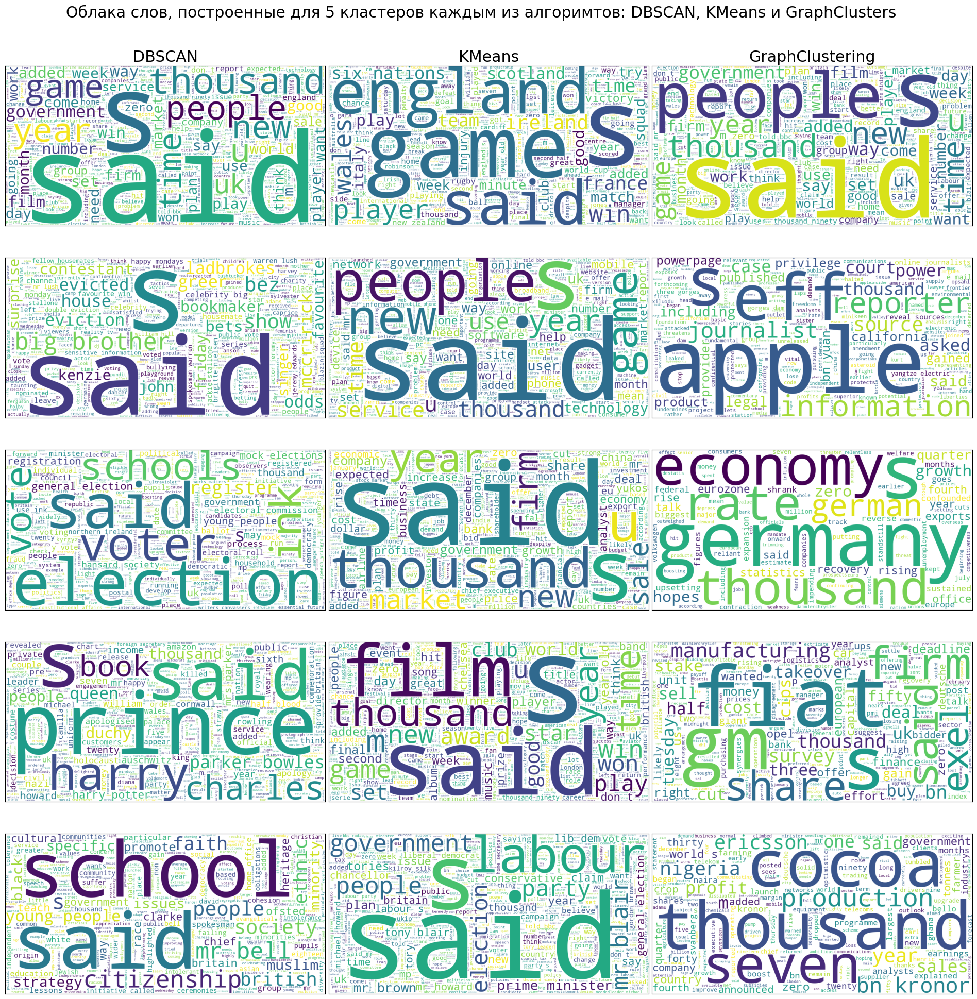

In [60]:
fig, axis = plt.subplots(5, 3, figsize=(20, 20))
plt.rcParams.update({'font.size': 18})
title = fig.suptitle(
    'Облака слов, построенные для 5 кластеров каждым из алгоримтов: DBSCAN, KMeans и GraphClusters')
title.set_position((0.5, 1.001))
fig.tight_layout()
fig.subplots_adjust(wspace=0.01, hspace=0.05)

for ax_row in axis:
    for ax in ax_row:
        ax.get_yaxis().set_visible(False)
        ax.get_xaxis().set_visible(False)

axis[0, 0].set_title('DBSCAN')
axis[0, 1].set_title('KMeans')
axis[0, 2].set_title('GraphClustering')

for i, ax in enumerate(axis[:, 0]):
    ax.imshow(draw_wordcloud(data.text[dbscan_indexes == i]))

for i, ax in enumerate(axis[:, 1]):
    ax.imshow(draw_wordcloud(data.text[kmeans_indexes == i]))

for i, ax in enumerate(axis[:, 2]):
    ax.imshow(draw_wordcloud(data.text[singularity_indexes == i]))

Применив 3 различных алгоритма класетризации на 5 кластеров исходного множетсва объектов мы получили 15 различных множеств слов, наиболее точно характеризующих каждый из получаемых класетров (шумовые объекты, полученные в DBSCAN не рассматриваются). О первичных наблюдениях для каждого из методов писалось по мере реализации, а потому лишь отметим, что каждое из полученных облак слов имеет какую-либо тематику и каждый метод класетризации смог выделять темы, однако с переменным успехом. Так, например, тематики DBSCAN много менее интерпертиуемы, чем тематики kMeans. Далее озаглавим каждую из них, для каждого из методов введя нумерацию сверзу вниз от 1 до 5.
 
---

DBSCAN:

1. Спортивные состязания
2. Деятельность популярных деятелей искуства или прочих селебрити пространств
3. Выборы
4. Британская королевская семья
5. Опять же выборы в государстве, с уклоном в гражланство людей с ращличным этносом

*Видно, как DBSCAN сложно выделять в данной конкретной задаче осмысленные и непохожие кластера. Так появились и два класетра на одну тематику, чего не происходило ранее в kMeans, другие темы сложно различимы, так как либо в ни х входит малое число объектов, чтобы адекватно высчитывать статистики веса каждого слова в класетризацию, либо наборот в кластере слишком много объектов, что зашумляют "смысл" итогового представления кластера.*

Таким образом видно, что для применения DBSCAN стоит использовать много меньшие показатели EPS при инициализации, что для нас означает поиск более малых кластеров по размеру (числу объектов внутри). Однако это бы означало много больше ручной работы по просмотрую всех кластеров.

---

kMeans:

1. Спортивные матчи  (при чем кластер большой и в него теперь относятся тексты о играх ращличных стран, тут и Франция, и Ирландия, и Британия, да и игры обощреваются разные (футбол и рэгби))
2. Новости IT
3. Бизнес новости
4. Награждения в искусствах, в особенности в кино
5. ВЫборы в государстве

*Можно сказать, что наполненность и смысловой набор кластеров для данного эксперимента изменился крайне мало по сравнению с предыдущим использованием kMeans. При переходе от 8 класетров к 5 темы все так же остались диверфиринцированными по смыслу, а изменения скорее сказались на наполненности кластеров: так теперь кластеры, отвечающие за различные футбольные матчи слились в один, то же самое с новостями искусства и награждением в кино-фестивале*

Таким образом kMeans в данном конкретном сценарии применения для поиска малого числа интерпретируемых класетров в рамках разведывательного анализа применим лучше всего. Но при этом его применение сопровождается небрежностью конечного результата (смеси различных тематик в одну)

---

Графовая кластеризация:

1. Не идентифицируемый - это тот самый большой кластер, куда попали все объекты, что метод посчитал неинтересными
2. Новости IT, tech гигантов и силиконовой долины
3. Экономика Германии
4. Производитель автомобилей fiat
5. Индустрия сладостей (шоколада) и экспортеры шоколада из африки

*Для данного алгоритма так же как и для DBSCAN свойсвтенно выделять крайне малые и специфичные кластеры. В то время, как kMeans пытается все объекты хоть сколько-нибудь похожие перетянуть в один кластер, Графовый алгоритм делает противоположное (как и тот же самый DBSCAN). Однако здесь проявляется огромный плюс Графового алгоритма: он способен подмечать и доставать даже самые малые, но осмысленные кластеры. В рамках нашей задачи это означает, что он способен выделять даже самые маленькие тематики (он нашел два класетра, ни разу до этого не встречавшиеся в ответах других алгоритмов класетризации (про концерн fiat и Нигерийский шоколад)). С другой же стороны, для данного метода кластеризации видно, что он не способен пытаться равномерно заполнять кластеры, и в погоне за качеством выделения малых тематик, мы жертвум наполненностью и адекватностью итогвых кластеров (они могут быть как просто пустые, так и содержать практически все объекты выборки, так как они кажутся алгоритму шумовыми).*

Таким образом, применение Графового алгоритма имеет смысл в нашей задаче, когда мы ищем сразу же большое число кластеров, а не ограничиваемся лишь 5 экземплярами, как сейчас

---


**Задание 1.6 (1 балл).** Также, для анализа качества кластеризации иногда бывает полезно "посмотреть" накластеры. Обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

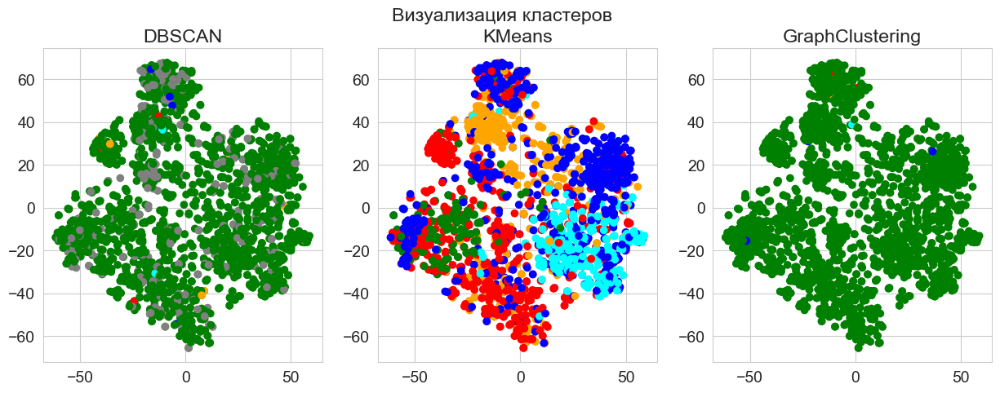

In [70]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({'font.size': 14})
sns.set_style('whitegrid')

t_sne = TSNE(2, perplexity=30)
dots = t_sne.fit_transform(X.toarray())

fig, axis = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Визуализация кластеров')
axis[0].set_title('DBSCAN')
axis[1].set_title('KMeans')
axis[2].set_title('GraphClustering')

mapper = {
    -1: 'grey',
    0: 'green',
    1: 'blue',
    2: 'orange',
    3: 'red',
    4: 'cyan'
}
c_dbscan = list(map(lambda x: mapper[x], dbscan_indexes))
c_kmeans = list(map(lambda x: mapper[x], kmeans_indexes))
c_singul = list(map(lambda x: mapper[x], singularity_indexes))

dbscan_sorting = np.argsort(dbscan_indexes)
axis[0].scatter(dots[dbscan_sorting, 0], dots[dbscan_sorting, 1], c=c_dbscan)

kmeans_sorting = np.argsort(kmeans_indexes)
axis[1].scatter(dots[kmeans_sorting, 0], dots[kmeans_sorting, 1], c=c_kmeans)

singul_sorting = np.argsort(singularity_indexes)
axis[2].scatter(dots[singul_sorting, 0], dots[singul_sorting, 1], c=c_singul)

(?) Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Сделаете выводы о каждом исследованном в части 1 алгоритме и их применимости к задаче тематического моделирования. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:**
Видно, что самым интересным с точки зрения наполненности кластеров является кластеризация при помощи KMeans. Для него кластеры равномерны по заполненности, когда для Графового алгоритма и DBSCAN свойсвтенна общая черта: один кластер содержит подавляющее число объектов выборки, все же остальные содержат единицы из них. При визуализации с помощью t-SNE алгоритмов все становится очевидным: DBSCAN и Графовый алгоритм большинство объектов причисляют к одному классетру, остальные же разбросаны по пространтсу относительно близко друг к другу. 

Для KMeans распределение кластеров кажется наиболее правильным: видны отдельные цветовые зоны на полученной карте обектов, местами наезжающие друг на друга. Для прочих методов вся карта заполнена одним общим цветом, с редкими вкраплениями других цветов (объектов, причисляемых к другим кластерам). Тот факт, что объекты одного кластера могут быть достаточно далеко друг от друга расположены, сследует из неидеальности метода t-SNE.

Таким образом единственным подходящим методом кластеризации для поиска интерпретируемых и **достаточно** больших тематик является алгоритм kMeans, так как только он смог адекватно разделить выборку. Происходит это из-за двух причин:
- Разреженность пространства признаков tf-idf для векторизованных текстов
- Методы поиска связей между объектами

В том время как kMeans по постановке решаемой задачи стремится "натянуть" пять озвученных ранее кластеров на все объекты выборки. Это видно на проецируемом пространстве от t-SNE, где кластеры налезают друг на друга. Однако это заставляет делать кластеры достаточно объемными. В это же время DBSCAN или Графовый алгоритм основываются на структуре (форме расположения в пространстве tf-idf) исходных данных. Из-за разреженнсоти данных они стремятся охедить все обхекты в одну большую структуру, оставляя под отсальныуе кластеры малое число объектов на переферии. Этим так же может быть объяснено, почему на карте от DBSCAN и Графового алгоритма есть объекты одного кластеры, что расположены достаточно удаленно друг от друга.

**Итог:** единственный адлекватный алгоритм для кластеризации текстов в рамках полученных после tf-idf векторизованных текстов является лишь kMeans. Другие же алгоритмы выделяют слишком слоджные структуры, что в данной задаче является скорее минусом, чем плюсом. Исправить это можно было бы при подборе параметров tf-idf, попробовав убрать частовстречаемые слова, понизив размерность векторного простравнства и так далее, однако это лишь показывает состоятельность метода kMeans в рамках этого датасета. 

## Часть 2. Transfer learning для задачи классификации текстов.

**Задание 3.1 (4 балла).** Вспомним, что у нас есть разметка для тематик статей. Просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 1:13:6. 70% выборки будем использовать для обучения, а остальные 30% для валидации

Обучите метрику Махаланобиса любыми **тремя**  методами (отсюда)[http://contrib.scikit-learn.org/metric-learn/supervised.html] только на маленьком куске (5%) обучающей выборки. Кластеризуйте данные методом k-means с обученными метриками  и проанализирйте полученные результаты. 

Сравните 3 подхода к класификации:

Логистическая регрессия на tf-idf признаках

K-Means с евклидовой метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

K-Means с обученной метрикой на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всей обучающей выборке целиком (70%), а итоговый классификатор и обучение метрики обучайте только на ее маленьком куске (5%). Подберите гиперпараметры моделей по качеству на валидационной выборке (30%), а затем оцените качество на тестовой выборке (не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации).

**В качестве метрики качества используйте accuracy**

Можете провести дополнительные исследования с другими методами кластеризации и получить более высокое качество. За качественные исследования с хорошим описанием можно получить **до 2 бонусных баллов**.

Заметим важную вещь: в задании говорится о Валидации! После проведенных экспериментов с использвоанием валидации от 5% train объекто (от всего 111) было видно, что либо итоговое качество получается ужасным (так как малое число объектов остается в train, а все остальное на валидации), либо наоборот, настройка конечного решения на валидации бессмысленна, так как малое число попала теперь уже в валидацию. 

___Здесь я принял на себя решение взять доп. объекты для валидации от неразмеченных объектов с unsupervised части. Поэтому теперь на тест идет 20% всех объектов, на train 0.8 * 0.05 объектов, unsupervised часть состоит из 0.65 * 0.8 всех объектов, а валидация из оставшихся 0.3 * 0.8___

In [31]:
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer

# creation of subsets
mask = np.arange(data.shape[0])
np.random.shuffle(mask)

# 5% of train
mask_supervised = mask[:int(len(mask) * 0.05 * 0.8)]
# 65% + 5% of train
mask_unsupervised = mask[int(len(mask) * 0.05 * 0.8)
                             : int(len(mask) * 0.7 * 0.8)]
# 30% + 65% + 5% -> full train: 80% dataset
mask_valid = mask[int(len(mask) * 0.7 * 0.8): int(len(mask) * 0.8)]
# test: 20% dataset
mask_test = mask[int(len(mask) * 0.8):]


# initial data
tf_idf = TfidfVectorizer(min_df=20, max_df=0.4)
tf_idf.fit(data.text[mask[:int(len(mask) * 0.7 * 0.8)]])
X = tf_idf.transform(data.text).toarray()

label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(data['category'])


# creation of data sets
X_train = X[mask_supervised, :]
X_unsupervised = X[mask_unsupervised, :]
X_validate = X[mask_valid, :]
X_test = X[mask_test, :]

y_train = Y[mask_supervised]
y_validate = Y[mask_valid]
y_test = Y[mask_test]

In [32]:
# save obtained stets
# X_train.dump('./X_train.dll')
# X_unsupervised.dump('./X_unsupervised.dll')
# X_validate.dump('./X_validate.dll')
# X_test.dump('./X_test.dll')
# y_train.dump('./y_train.dll')
# y_validate.dump('./y_validate.dll')
# y_test.dump('./y_test.dll')

In [25]:
# load sets
X_train = np.load('./X_train.dll', allow_pickle=True)
X_unsupervised = np.load('./X_unsupervised.dll', allow_pickle=True)
X_validate = np.load('./X_validate.dll', allow_pickle=True)
X_test = np.load('./X_test.dll', allow_pickle=True)
y_train = np.load('./y_train.dll', allow_pickle=True)
y_validate = np.load('./y_validate.dll', allow_pickle=True)
y_test = np.load('./y_test.dll', allow_pickle=True)

Обучение метрики махаланубиса:

In [26]:
from metric_learn import LMNN, NCA, LFDA, MLKR

# Large Margin Nearest Neighbor Metric Learning (LMNN)
lmnn = LMNN(n_neighbors=3, learn_rate=1e-5)
lmnn.fit(X_train, y_train)

# Neighborhood Components Analysis (NCA)
nca = NCA(max_iter=1000)
nca.fit(X_train, y_train)

# Local Fisher Discriminant Analysis (LFDA)
# lfda = LFDA(k=2)
# lfda.fit(X_train, y_train)

# Metric Learning for Kernel Regression (MLKR)
mlkr = MLKR()
mlkr.fit(X_train, y_train)

MLKR()

#### Обучим логистическую регрессию без использования кластеризации

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import warnings


def warn(*args, **kwargs):
    pass


warnings.warn = warn


def get_best_stats(X_train, y_train, X_validate, y_validate):
    stats = []
    for C in np.hstack([np.logspace(-6, 2, 20)]):
        for l1_ratio in np.linspace(0, 1, 11):
            model_logregr = LogisticRegression(max_iter=300,
                                               n_jobs=-1,
                                               C=C,
                                               solver='saga',
                                               l1_ratio=l1_ratio,
                                               penalty='elasticnet')
            model_logregr.fit(X_train, y_train)
            stats.append((C, l1_ratio, accuracy_score(
                y_validate, model_logregr.predict(X_validate)), model_logregr))

    return max(stats, key=lambda x: x[2])


C, l1_ratio, acc, model = get_best_stats(
    X_train, y_train, X_validate, y_validate)

print('Лучшее качество, полученное на LogRegr без использования кластеризации:',
      accuracy_score(y_test, model.predict(X_test)))

Лучшее качество, полученное на LogRegr без использования кластеризации: 0.903370786516854


#### Посмотрим на качество конечного классификатора при использовании кластеризации с kMeans
Получим модель, использующую классический KMeans для кластеризации данных и получения центров этих кластеров

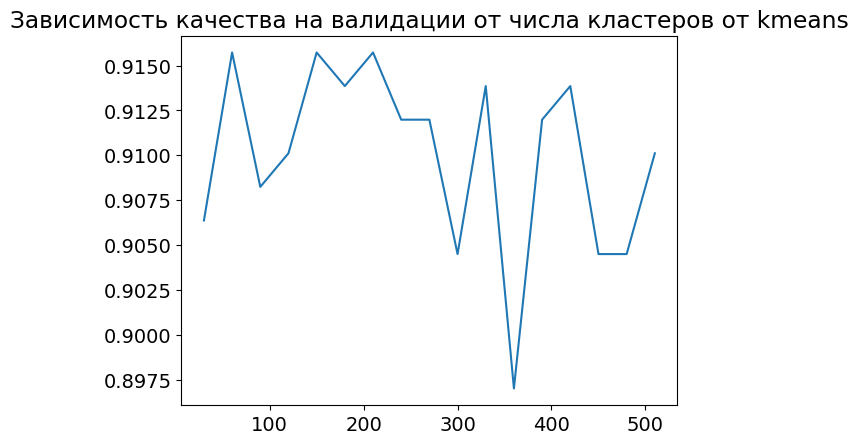

In [68]:
import warnings
import matplotlib.pyplot as plt


def warn(*args, **kwargs):
    pass


warnings.warn = warn

acc_tendency = []
stats = []

for clusters in range(30, 520, 30):
    kmeans = KMeans(n_clusters=clusters, max_iter=300,)
    kmeans.fit(np.vstack([X_train, X_unsupervised]))

    dists_train = scipy.spatial.distance_matrix(
        X_train, kmeans.cluster_centers_)
    dists_val = scipy.spatial.distance_matrix(
        X_validate, kmeans.cluster_centers_)

    C, l1_ratio, acc_val, model = get_best_stats(
        dists_train, y_train, dists_val, y_validate)

    acc_tendency.append(acc_val)
    stats.append((kmeans, C, l1_ratio, acc_val, model))

plt.rcParams.update({'font.size': 14})
plt.title('Зависимость качества на валидации от числа кластеров от kmeans')
plt.plot(range(30, 520, 30), acc_tendency)

Очевидно, что от числа кластеров будет зависеть и конечное качество. Виден стремительный рост Accuracy с ростом числа кластеров в начале и столь же стремительное в среднем падение качества ближе к концу. Выберем лучшую модель на валидации и посмотрим на качество на тесте.

In [69]:
kmeans, _, _, _, kmeans_model = max(stats, key=lambda x: x[3])
dists = scipy.spatial.distance_matrix(X_test, kmeans.cluster_centers_)
print('Качество логистической регрессии с классическим kmeans на тесте:', accuracy_score(
    y_test, kmeans_model.predict(dists)))

Качество логистической регрессии с классическим kmeans на тесте: 0.9280898876404494


Тем самым видно, что при использовании Кластеризации данных при помощи kMeans с евклидовой метрикой, мы смогли получить лучший результат на тестовой выборке в сравнении с алгоритмом, обучающемся только лишь на векторизованных при помощи tf-idf текстах.

#### Теперь же проведем класетриазцию с использованием обученных метрик

Проделаем то же самое для каждой из обученных метрик:

In [28]:
def get_accuracy(method, X_train, y_train, X_validate, y_validate):
    kmeans = KernelKMeans(n_clusters=60, iters=20, cov_matr=method.get_mahalanobis_matrix(),
                          initialization_method='farrest', kernel='custom_mahalanobis', verbose=True)
    clusters, _ = kmeans.fit_predict(np.vstack([X_train, X_unsupervised]))

    dists_train = scipy.spatial.distance_matrix(X_train, clusters)
    dists_val = scipy.spatial.distance_matrix(X_validate, clusters)

    return get_best_stats(dists_train, y_train, dists_val, y_validate)


lmnn_stats = get_accuracy(lmnn, X_train, y_train, X_validate, y_validate)
nca_stats = get_accuracy(nca, X_train, y_train, X_validate, y_validate)
mlkr_stats = get_accuracy(mlkr, X_train, y_train, X_validate, y_validate)

print(f'lmnn val. acc. {lmnn_stats[2]=} \nnca val. acc. {
      nca_stats[2]=} \nmlkr val. acc. {mlkr_stats[2]=}')

100%|██████████| 20/20 [1:55:22<00:00, 346.13s/it]


lmnn val. acc. lmnn_stats[2]=0.8782771535580525 
nca val. acc. nca_stats[2]=0.9026217228464419 
mlkr val. acc. mlkr_stats[2]=0.8951310861423221


(?) Сделайте выводы о применимости методов кластеризации для улучшения качества классификации. **За отсутствие выводов будет наложен штраф до 2.5 баллов.**

**Ответ:**